In [ ]:
# Import required libraries
import torch
import torchvision
from torchvision import transforms, datasets
import numpy as np
import os
import json

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load pretrained ResNet-34 model
model = torchvision.models.resnet34(weights='IMAGENET1K_V1')
model.eval()
model = model.to(device)

# Define ImageNet normalization transform
mean_norms = [0.485, 0.456, 0.406]
std_norms = [0.229, 0.224, 0.225]

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean_norms, std=std_norms)
])

# Load dataset from the correct Kaggle path
data_path = "/kaggle/input/testdataset/TestDataSet"
dataset = datasets.ImageFolder(root=data_path, transform=transform)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=32, shuffle=False)

# Check for JSON file and load class index mapping
json_files = os.listdir(data_path)
print("Available JSON files:", json_files)

# Use the correct JSON filename as found
json_path = os.path.join(data_path, "labels_list.json")
with open(json_path, "r") as f:
    raw = json.load(f)  # Load JSON as a list of strings like "401: accordion"
    class_index_list = [int(line.split(":")[0].strip()) for line in raw]

# Create a label remapping from ImageFolder index to true ImageNet index
true_label_map = {i: int(class_index_list[i]) for i in range(len(class_index_list))}

# Define evaluation function using the remapped labels
def evaluate_with_remap(model, dataloader, true_label_map):
    model.eval()
    top1_correct = 0
    top5_correct = 0
    total = 0

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            true_labels = torch.tensor(
                [true_label_map[label.item()] for label in labels],
                device=device
            )

            outputs = model(inputs)
            _, preds = outputs.topk(5, dim=1)
            top1_correct += (preds[:, 0] == true_labels).sum().item()
            top5_correct += sum([true_labels[i] in preds[i] for i in range(len(true_labels))])
            total += labels.size(0)

    top1_acc = top1_correct / total
    top5_acc = top5_correct / total
    return top1_acc, top5_acc

## Task 1
# Run evaluation and print accuracy
top1, top5 = evaluate_with_remap(model, dataloader, true_label_map)
print(f"Top-1 Accuracy: {top1:.4f}")
print(f"Top-5 Accuracy: {top5:.4f}")

Available JSON files: ['n02769748', 'n02966687', 'n02730930', 'n02965783', 'n02980441', 'n02727426', 'n02950826', 'n02797295', 'n02910353', 'n02793495', 'n02999410', 'n02676566', 'n03017168', 'n02802426', 'n02865351', 'n02917067', 'n02966193', 'n02892767', 'n02708093', 'n02859443', 'n02701002', 'n02699494', 'n02981792', 'n02963159', 'n02749479', 'n02877765', 'n03026506', 'n02992211', 'n02988304', 'labels_list.json', 'n02692877', 'n02790996', 'n03032252', 'n02795169', 'n02823428', 'n02841315', 'n02777292', 'n03028079', 'n02835271', 'n02840245', 'n02974003', 'n02948072', 'n03000684', 'n02814533', 'n02939185', 'n02808304', 'n02843684', 'n02894605', 'n02786058', 'n02804414', 'n02930766', 'n02787622', 'n02823750', 'n02909870', 'n02879718', 'n03042490', 'n03000247', 'n02895154', 'n02892201', 'n02794156', 'n02704792', 'n02860847', 'n02979186', 'n02951358', 'n02883205', 'n03014705', 'n02869837', 'n02992529', 'n02951585', 'n02791124', 'n02687172', 'n02916936', 'n02791270', 'n02971356', 'n027881

In [ ]:
with open(json_path, "r") as f:
    label_list = json.load(f)

# Convert to {i: class_index} map
true_label_map = {i: int(v.split(":")[0]) for i, v in enumerate(label_list)}

In [ ]:
## Task 2

In [ ]:
# Import required modules
from torch import nn
from torchvision.utils import save_image
from torch.utils.data import DataLoader, TensorDataset

# Define FGSM attack function
def fgsm_attack_raw(image_raw, epsilon, data_grad):
    # attack in unnormalized space
    sign_data_grad = data_grad.sign()
    perturbed_image_raw = image_raw + epsilon * sign_data_grad
    return torch.clamp(perturbed_image_raw, 0, 1)

# Run FGSM attack and save adversarial images
os.makedirs("/kaggle/working/Adversarial_Test_Set_1", exist_ok=True)

loss_fn = nn.CrossEntropyLoss()
epsilon = 0.02  # per instructions
success = 0
total = 0

adv_images = []
adv_labels = []
pixel_diffs = []

# Ensure model is on correct device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

# Define evaluation function using the remapped labels
def evaluate_with_remap(model, dataloader, true_label_map):
    model.eval()
    top1_correct = 0
    top5_correct = 0
    total = 0

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            true_labels = labels.to(device)  # Already mapped labels

            outputs = model(inputs)
            _, preds = outputs.topk(5, dim=1)
            top1_correct += (preds[:, 0] == true_labels).sum().item()
            top5_correct += sum([true_labels[i] in preds[i] for i in range(len(true_labels))])
            total += labels.size(0)

    top1_acc = top1_correct / total
    top5_acc = top5_correct / total
    return top1_acc, top5_acc

orig_images = []
skip_pred_wrong = 0
skip_attack_failed = 0
success = 0
total = 0
from torchvision import transforms

# Normalization functions
unnorm = transforms.Normalize(
    mean=[-m / s for m, s in zip(mean_norms, std_norms)],
    std=[1 / s for s in std_norms]
)
norm = transforms.Normalize(
    mean=mean_norms,
    std=std_norms
)

orig_images = []
adv_images = []
adv_labels = []

skip_pred_wrong = 0
skip_attack_failed = 0
success = 0
total = 0

for input_batch, label_batch in dataloader:
    input_batch = input_batch.to(device)
    label_batch = label_batch.to(device)

    for j in range(len(input_batch)):
        input_img = input_batch[j:j+1]  # shape [1, C, H, W]
        label = label_batch[j:j+1]

        label_scalar = label.item()
        true_label_index = true_label_map[label_scalar]
        true_label = torch.tensor([true_label_index], device=device)

        # Step 1: convert to unnormalized raw image
        input_img_raw = unnorm(input_img.detach().squeeze(0)).unsqueeze(0).to(device).requires_grad_(True)

        # Step 2: normalize for model input
        input_img_norm = norm(input_img_raw)

        output = model(input_img_norm)
        predicted_class = output.argmax(dim=1)[0].item()
        if predicted_class != true_label.item():
            skip_pred_wrong += 1
            continue

        loss = loss_fn(output, true_label)
        model.zero_grad()
        loss.backward()

        # Step 3: perform attack in raw space
        data_grad = input_img_raw.grad.data
        perturbed_raw = fgsm_attack_raw(input_img_raw, epsilon, data_grad)
        perturbed_norm = norm(perturbed_raw.detach())  # renormalize for model input

        # Step 4: check L∞ difference in raw space
        diff = torch.max(torch.abs(perturbed_raw - input_img_raw))
        assert diff <= epsilon + 1e-6, f"L∞ difference too high: {diff.item()}"

        # Step 5: evaluate attack
        output_adv = model(perturbed_norm)
        final_pred = output_adv.argmax(dim=1)[0].item()

        if final_pred != true_label.item():
            success += 1
        else:
            skip_attack_failed += 1

        total += 1

        # Save perturbed image
        save_image(perturbed_norm.squeeze(0).cpu(), f"/kaggle/working/Adversarial_Test_Set_1/adv_{len(adv_images)}.png")

        adv_images.append(perturbed_norm.cpu())
        adv_labels.append(torch.tensor(true_label_index))
        orig_images.append(input_img_norm.detach().cpu())

        if len(adv_images) >= 500:
            break
    if len(adv_images) >= 500:
        break

# === Print Statistics ===
print(f"\nFGSM Attack Summary:")
print(f"Total evaluated samples: {total}")
print(f"Successful attacks: {success}")
print(f"Samples skipped due to incorrect original prediction: {skip_pred_wrong}")
print(f"Samples where attack failed despite correct original prediction: {skip_attack_failed}")
print(f"Adversarial images collected: {len(adv_images)}")



FGSM Attack Summary:
Total evaluated samples: 380
Successful attacks: 363
Samples skipped due to incorrect original prediction: 120
Samples where attack failed despite correct original prediction: 17
Adversarial images collected: 380


In [ ]:
from torch.utils.data import DataLoader, TensorDataset

# Create DataLoader for adversarial examples
adv_dataset = TensorDataset(torch.cat(adv_images, dim=0), torch.tensor(adv_labels))
adv_loader = DataLoader(adv_dataset, batch_size=32, shuffle=False)

# Evaluate on adversarial images
top1_adv, top5_adv = evaluate_with_remap(model, adv_loader, true_label_map)
print(f"[FGSM Adversarial Eval] Top-1 Accuracy: {top1_adv:.4f}")
print(f"[FGSM Adversarial Eval] Top-5 Accuracy: {top5_adv:.4f}")

[FGSM Adversarial Eval] Top-1 Accuracy: 0.0447
[FGSM Adversarial Eval] Top-5 Accuracy: 0.2474


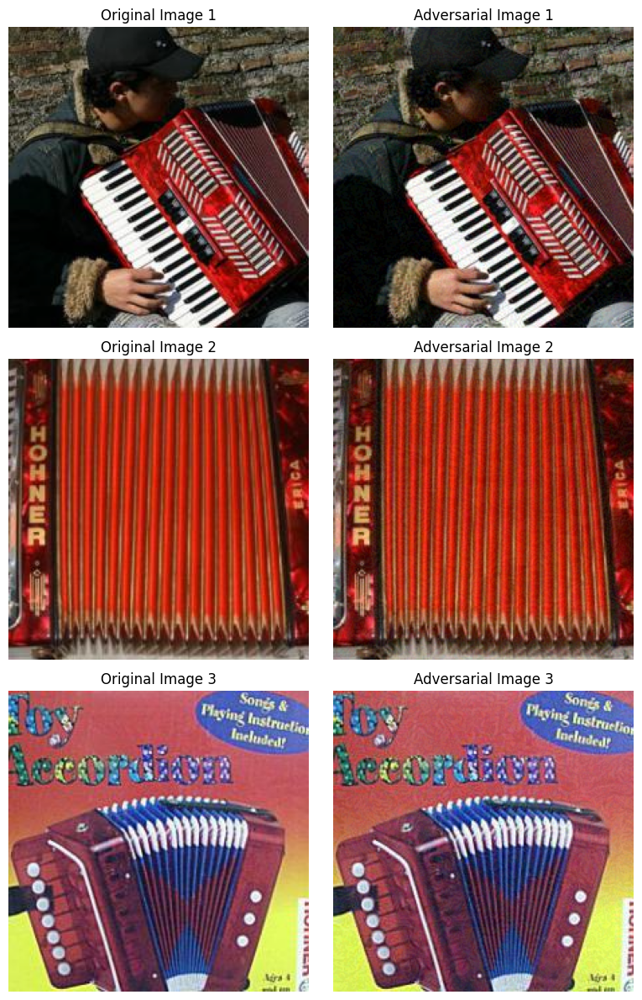

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define inverse normalization
inv_transform = transforms.Normalize(
    mean=[-m / s for m, s in zip(mean_norms, std_norms)],
    std=[1 / s for s in std_norms]
)

num_examples = 3
fig, axes = plt.subplots(num_examples, 2, figsize=(8, 4 * num_examples))

for i in range(num_examples):
    orig_img = inv_transform(orig_images[i].squeeze(0)).detach().numpy().transpose(1, 2, 0)
    adv_img = inv_transform(adv_images[i].squeeze(0)).detach().numpy().transpose(1, 2, 0)

    orig_img = np.clip(orig_img, 0, 1)
    adv_img = np.clip(adv_img, 0, 1)

    axes[i, 0].imshow(orig_img)
    axes[i, 0].set_title(f"Original Image {i+1}")
    axes[i, 0].axis('off')

    axes[i, 1].imshow(adv_img)
    axes[i, 1].set_title(f"Adversarial Image {i+1}")
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
## Task 3

In [ ]:
# PGD parameters
epsilon = 0.02
alpha = 0.002
iters = 10

pgd_orig_images = []
pgd_adv_images = []
pgd_adv_labels = []

success = 0
skip_pred_wrong = 0
skip_attack_failed = 0
total = 0

os.makedirs("/kaggle/working/Adversarial_Test_Set_2", exist_ok=True)

# === PGD attack function (L∞-constrained) ===
def pgd_attack_raw(image_raw, model, true_label, loss_fn, epsilon=0.02, alpha=0.002, iters=10):
    perturbed = image_raw.clone().detach().to(device)
    original = image_raw.clone().detach().to(device)

    for _ in range(iters):
        perturbed.requires_grad = True
        output = model(norm(perturbed))
        loss = loss_fn(output, true_label)
        model.zero_grad()
        loss.backward()

        grad = perturbed.grad.data.sign()
        perturbed = perturbed + alpha * grad


        perturbation = torch.clamp(perturbed - original, min=-epsilon, max=epsilon)
        perturbed = torch.clamp(original + perturbation, 0, 1).detach()

    return perturbed

# === Main attack loop ===
for input_batch, label_batch in dataloader:
    input_batch = input_batch.to(device)
    label_batch = label_batch.to(device)

    for j in range(len(input_batch)):
        input_img = input_batch[j:j+1]
        label = label_batch[j:j+1]

        label_scalar = label.item()
        true_label_index = true_label_map[label_scalar]
        true_label = torch.tensor([true_label_index], device=device)

        # Unnormalize
        input_img_raw = unnorm(input_img.detach().squeeze(0)).unsqueeze(0).to(device)
        input_img_norm = norm(input_img_raw)

        # Skip if original prediction is wrong
        output = model(input_img_norm)
        predicted_class = output.argmax(dim=1)[0].item()
        if predicted_class != true_label.item():
            skip_pred_wrong += 1
            continue

        # Run PGD
        perturbed_raw = pgd_attack_raw(input_img_raw, model, true_label, loss_fn,
                                       epsilon=epsilon, alpha=alpha, iters=iters)

        # Check L∞
        diff = torch.max(torch.abs(perturbed_raw - input_img_raw)).item()
        print(f"[PGD-check] L∞ pixel diff: {diff:.5f}")
        assert diff <= epsilon + 1e-6, f"L∞ diff too high: {diff}"

        # Post-attack prediction
        perturbed_norm = norm(perturbed_raw)
        output_adv = model(perturbed_norm)
        final_pred = output_adv.argmax(dim=1)[0].item()

        if final_pred != true_label.item():
            success += 1
        else:
            skip_attack_failed += 1

        total += 1

        # Save
        save_image(perturbed_norm.squeeze(0).cpu(), f"/kaggle/working/Adversarial_Test_Set_2/adv_{len(pgd_adv_images)}.png")
        pgd_orig_images.append(input_img_norm.detach().cpu())
        pgd_adv_images.append(perturbed_norm.detach().cpu())
        pgd_adv_labels.append(torch.tensor(true_label_index))

        if len(pgd_adv_images) >= 500:
            break
    if len(pgd_adv_images) >= 500:
        break

print(f"\nPGD Attack Summary:")
print(f"Total evaluated samples: {total}")
print(f"Successful attacks: {success}")
print(f"Samples skipped due to incorrect original prediction: {skip_pred_wrong}")
print(f"Samples where attack failed despite correct original prediction: {skip_attack_failed}")
print(f"PGD adversarial images collected: {len(pgd_adv_images)}")

[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel diff: 0.02000
[PGD-check] L∞ pixel

In [ ]:
from torch.utils.data import DataLoader, TensorDataset

# === PGD Evaluation ===
adv_dataset = TensorDataset(torch.cat(pgd_adv_images, dim=0), torch.tensor(pgd_adv_labels))
adv_loader = DataLoader(adv_dataset, batch_size=32, shuffle=False)

top1_adv, top5_adv = evaluate_with_remap(model, adv_loader, true_label_map)
print(f"[PGD Adversarial Eval] Top-1 Accuracy: {top1_adv:.4f}")
print(f"[PGD Adversarial Eval] Top-5 Accuracy: {top5_adv:.4f}")

[PGD Adversarial Eval] Top-1 Accuracy: 0.0000
[PGD Adversarial Eval] Top-5 Accuracy: 0.0184


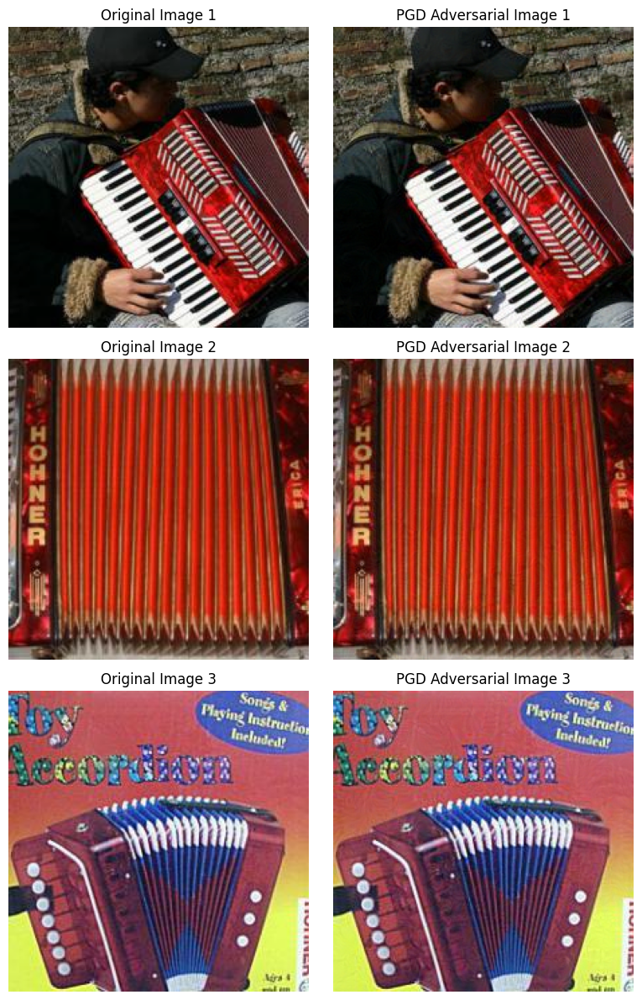

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

inv_transform = transforms.Normalize(
    mean=[-m / s for m, s in zip(mean_norms, std_norms)],
    std=[1 / s for s in std_norms]
)


num_examples = 3
fig, axes = plt.subplots(num_examples, 2, figsize=(8, 4 * num_examples))

for i in range(num_examples):
    orig_img = inv_transform(pgd_orig_images[i].squeeze(0)).detach().numpy().transpose(1, 2, 0)
    adv_img = inv_transform(pgd_adv_images[i].squeeze(0)).detach().numpy().transpose(1, 2, 0)

    orig_img = np.clip(orig_img, 0, 1)
    adv_img = np.clip(adv_img, 0, 1)

    axes[i, 0].imshow(orig_img)
    axes[i, 0].set_title(f"Original Image {i+1}")
    axes[i, 0].axis('off')

    axes[i, 1].imshow(adv_img)
    axes[i, 1].set_title(f"PGD Adversarial Image {i+1}")
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
## Task 4


Multi-Patch PGD Attack Summary:
Total evaluated samples: 380
Successful attacks: 379
Samples skipped due to incorrect original prediction: 120
Samples where attack failed despite correct original prediction: 1
Adversarial patch images collected: 380
[Patch Eval] Top-1 Accuracy: 0.1263
[Patch Eval] Top-5 Accuracy: 0.5026


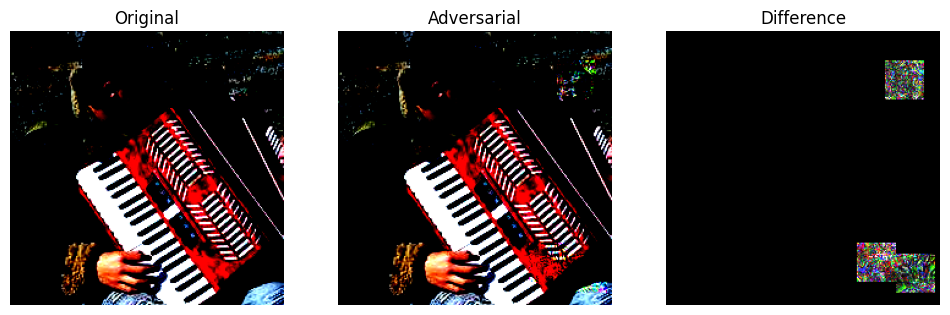

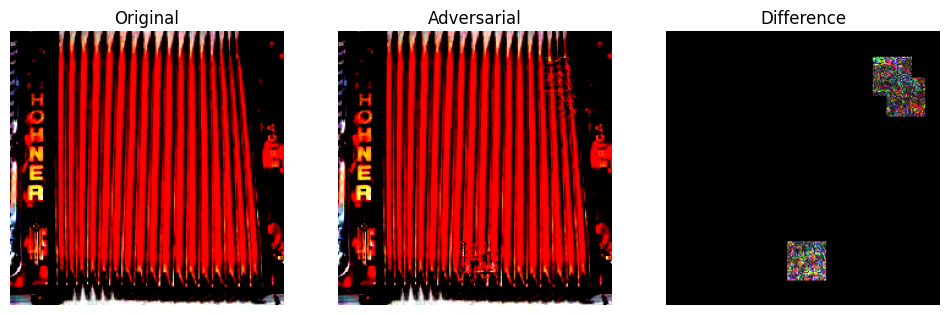

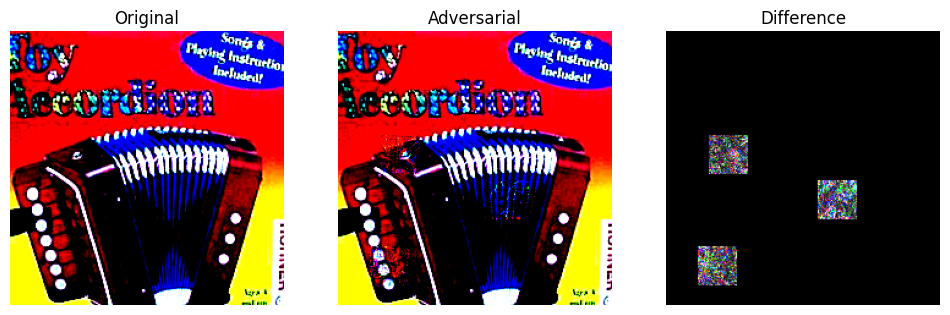

In [ ]:
# untargeted
import os
import random
import torch
from torchvision.utils import save_image
from torch.utils.data import DataLoader, TensorDataset
from torchvision import transforms

# === Multi-Patch PGD Attack Function ===
def multi_patch_pgd_attack(image, label, model, loss_fn, epsilon=0.5, alpha=0.01, iters=20, patch_size=32, num_patches=3):
    device = image.device
    perturbed = image.clone().detach()
    original = image.clone().detach()
    _, _, h, w = perturbed.shape

    patch_masks = []
    for _ in range(num_patches):
        top = random.randint(0, h - patch_size)
        left = random.randint(0, w - patch_size)
        mask = torch.zeros_like(image)
        mask[:, :, top:top+patch_size, left:left+patch_size] = 1.0
        patch_masks.append(mask)

    patch_mask = torch.clamp(sum(patch_masks), 0, 1)  # merged patch mask

    for _ in range(iters):
        perturbed.requires_grad = True
        output = model(norm(perturbed))
        loss = loss_fn(output, label)
        model.zero_grad()
        loss.backward()

        grad = perturbed.grad.detach()
        grad_patch = grad * patch_mask
        perturbed = perturbed + alpha * grad_patch.sign()

        perturb = torch.clamp(perturbed - original, min=-epsilon, max=epsilon)
        perturb = perturb * patch_mask
        perturbed = torch.clamp(original + perturb, 0, 1).detach()

    return perturbed

# === Parameters ===
patch_epsilon = 0.5
patch_alpha = 0.01
patch_iters = 60
patch_size = 32
num_patches = 3

# mean and std for normalization
mean_norms = [0.485, 0.456, 0.406]
std_norms = [0.229, 0.224, 0.225]

unnorm = transforms.Normalize(
    mean=[-m / s for m, s in zip(mean_norms, std_norms)],
    std=[1 / s for s in std_norms]
)
norm = transforms.Normalize(
    mean=mean_norms,
    std=std_norms
)

# === Containers ===
multi_patch_images = []
multi_patch_labels = []
multi_patch_orig_images = []
success = 0
skip_pred_wrong = 0
skip_attack_failed = 0
total = 0

os.makedirs("/kaggle/working/Adversarial_Test_Set_MultiPatch", exist_ok=True)

# === Run Attack ===
for input_batch, label_batch in dataloader:
    if len(multi_patch_images) >= 500:
        break

    input_batch = input_batch.to(device)
    label_batch = label_batch.to(device)

    for j in range(len(input_batch)):
        if len(multi_patch_images) >= 500:
            break

        input_img = input_batch[j:j+1].clone().detach()
        label = label_batch[j:j+1]
        label_scalar = label.item()
        true_label_index = true_label_map[label_scalar]
        true_label = torch.tensor([true_label_index], device=device)

        # skip if prediction is already incorrect
        output = model(input_img)
        if output.argmax(dim=1)[0].item() != true_label.item():
            skip_pred_wrong += 1
            continue

        # Unnormalize and attack
        input_img_raw = unnorm(input_img.squeeze(0)).unsqueeze(0).to(device)
        adv_img = multi_patch_pgd_attack(input_img_raw, true_label, model, loss_fn,
                                         epsilon=patch_epsilon, alpha=patch_alpha,
                                         iters=patch_iters, patch_size=patch_size,
                                         num_patches=num_patches)

        # Evaluate success
        output_adv = model(norm(adv_img))
        final_pred = output_adv.argmax(dim=1)[0].item()
        if final_pred != true_label.item():
            success += 1
        else:
            skip_attack_failed += 1

        total += 1
        multi_patch_images.append(adv_img.detach().cpu())
        multi_patch_labels.append(torch.tensor(true_label_index))
        multi_patch_orig_images.append(norm(input_img_raw).detach().cpu())

        save_image(norm(adv_img).squeeze(0), f"/kaggle/working/Adversarial_Test_Set_MultiPatch/adv_patch_{len(multi_patch_images)}.png")

# === Print Statistics ===
print(f"\nMulti-Patch PGD Attack Summary:")
print(f"Total evaluated samples: {total}")
print(f"Successful attacks: {success}")
print(f"Samples skipped due to incorrect original prediction: {skip_pred_wrong}")
print(f"Samples where attack failed despite correct original prediction: {skip_attack_failed}")
print(f"Adversarial patch images collected: {len(multi_patch_images)}")

# === Task 4 Evaluation ===
patch_dataset = TensorDataset(torch.cat(multi_patch_images, dim=0), torch.tensor(multi_patch_labels))
patch_loader = DataLoader(patch_dataset, batch_size=32, shuffle=False)

top1_patch, top5_patch = evaluate_with_remap(model, patch_loader, true_label_map)
print(f"[Patch Eval] Top-1 Accuracy: {top1_patch:.4f}")
print(f"[Patch Eval] Top-5 Accuracy: {top5_patch:.4f}")

# === Visualize 3 Examples ===
from matplotlib import pyplot as plt

for i in range(3):
    orig = multi_patch_orig_images[i].squeeze(0).permute(1, 2, 0)
    adv = norm(multi_patch_images[i]).squeeze(0).permute(1, 2, 0)
    diff = (adv - orig).abs()

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    axes[0].imshow(orig.numpy())
    axes[0].set_title("Original")
    axes[1].imshow(adv.numpy())
    axes[1].set_title("Adversarial")
    axes[2].imshow(diff.numpy())
    axes[2].set_title("Difference")
    for ax in axes:
        ax.axis('off')
    plt.show()


In [ ]:
# target

import os
import random
import torch
from torchvision.utils import save_image
from torch.utils.data import DataLoader, TensorDataset
from torchvision import transforms
import torchvision.models as models
from matplotlib import pyplot as plt

# === Parameters ===
patch_epsilon = 0.5
patch_alpha = 0.02
patch_iters = 80
patch_size = 40
num_patches = 5
num_classes = 1000

mean_norms = [0.485, 0.456, 0.406]
std_norms = [0.229, 0.224, 0.225]

unnorm = transforms.Normalize(
    mean=[-m / s for m, s in zip(mean_norms, std_norms)],
    std=[1 / s for s in std_norms]
)
norm = transforms.Normalize(mean=mean_norms, std=std_norms)

# === Targeted Patch PGD Attack ===
def multi_patch_pgd_attack_targeted(image, true_label, model, loss_fn,
                                    num_classes=1000, epsilon=0.5, alpha=0.01, iters=20, patch_size=32, num_patches=3):
    device = image.device
    perturbed = image.clone().detach()
    original = image.clone().detach()
    _, _, h, w = perturbed.shape

    patch_masks = []
    for _ in range(num_patches):
        top = random.randint(0, h - patch_size)
        left = random.randint(0, w - patch_size)
        mask = torch.zeros_like(image)
        mask[:, :, top:top+patch_size, left:left+patch_size] = 1.0
        patch_masks.append(mask)
    patch_mask = torch.clamp(sum(patch_masks), 0, 1)

    target_class = random.choice([i for i in range(num_classes) if i != true_label.item()])
    target_label = torch.tensor([target_class], device=device)

    for _ in range(iters):
        perturbed.requires_grad = True
        output = model(norm(perturbed))
        loss = -loss_fn(output, target_label)
        model.zero_grad()
        loss.backward()

        grad = perturbed.grad.detach()
        grad_patch = grad * patch_mask
        perturbed = perturbed + alpha * grad_patch.sign()

        perturb = torch.clamp(perturbed - original, min=-epsilon, max=epsilon)
        perturb = perturb * patch_mask
        perturbed = torch.clamp(original + perturb, 0, 1).detach()

    return perturbed, target_class

# === Attack Loop ===
os.makedirs("/kaggle/working/Adversarial_Test_Set_TargetedPatch", exist_ok=True)

targeted_patch_images = []
targeted_patch_labels = []
targeted_patch_targets = []
success = 0
skip_pred_wrong = 0
skip_attack_failed = 0
total = 0

for input_batch, label_batch in dataloader:
    if len(targeted_patch_images) >= 500:
        break

    input_batch = input_batch.to(device)
    label_batch = label_batch.to(device)

    for j in range(len(input_batch)):
        if len(targeted_patch_images) >= 500:
            break

        input_img = input_batch[j:j+1].clone().detach()
        label = label_batch[j:j+1]
        label_scalar = label.item()
        true_label_index = true_label_map[label_scalar]
        true_label = torch.tensor([true_label_index], device=device)

        output = model(input_img)
        if output.argmax(dim=1)[0].item() != true_label.item():
            skip_pred_wrong += 1
            continue

        input_img_raw = unnorm(input_img.squeeze(0)).unsqueeze(0).to(device)

        adv_img, target_class = multi_patch_pgd_attack_targeted(
            input_img_raw, true_label, model, loss_fn,
            epsilon=patch_epsilon, alpha=patch_alpha, iters=patch_iters,
            patch_size=patch_size, num_patches=num_patches, num_classes=num_classes
        )

        output_adv = model(norm(adv_img))
        final_pred = output_adv.argmax(dim=1)[0].item()
        if final_pred == target_class:
            success += 1
        else:
            skip_attack_failed += 1

        total += 1
        targeted_patch_images.append(adv_img.detach().cpu())
        targeted_patch_labels.append(torch.tensor(true_label_index))
        targeted_patch_targets.append(torch.tensor(target_class))

        save_image(norm(adv_img).squeeze(0), f"/kaggle/working/Adversarial_Test_Set_TargetedPatch/adv_patch_{len(targeted_patch_images)}.png")

print("\nTargeted Multi-Patch PGD Attack Summary:")
print(f"Total evaluated samples: {total}")
print(f"Successful targeted attacks: {success}")
print(f"Samples skipped due to incorrect original prediction: {skip_pred_wrong}")
print(f"Samples where attack failed to reach target: {skip_attack_failed}")
print(f"Targeted adversarial images collected: {len(targeted_patch_images)}")

# === Evaluate Targeted Patch Attack on ResNet ===
patch_dataset = TensorDataset(torch.cat(targeted_patch_images, dim=0), torch.tensor(targeted_patch_labels))
patch_loader = DataLoader(patch_dataset, batch_size=32, shuffle=False)

top1_patch, top5_patch = evaluate_with_remap(model, patch_loader, true_label_map)
print(f"[Targeted Patch Eval] Top-1 Accuracy: {top1_patch:.4f}")
print(f"[Targeted Patch Eval] Top-5 Accuracy: {top5_patch:.4f}")


Targeted Multi-Patch PGD Attack Summary:
Total evaluated samples: 380
Successful targeted attacks: 380
Samples skipped due to incorrect original prediction: 120
Samples where attack failed to reach target: 0
Targeted adversarial images collected: 380
[Targeted Patch Eval] Top-1 Accuracy: 0.0947
[Targeted Patch Eval] Top-5 Accuracy: 0.3132


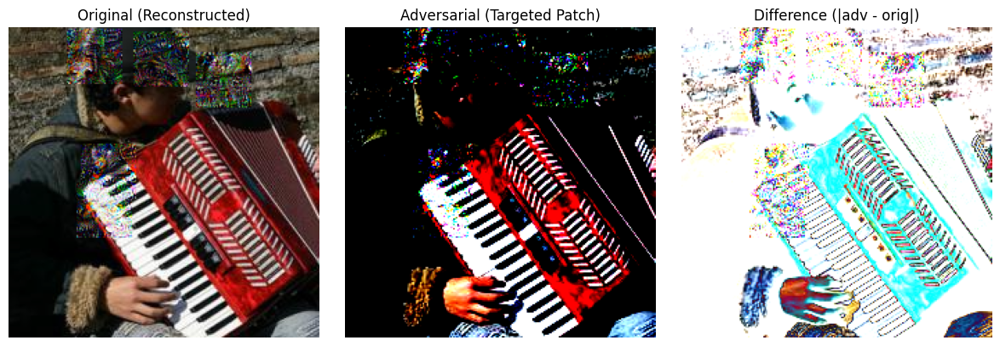

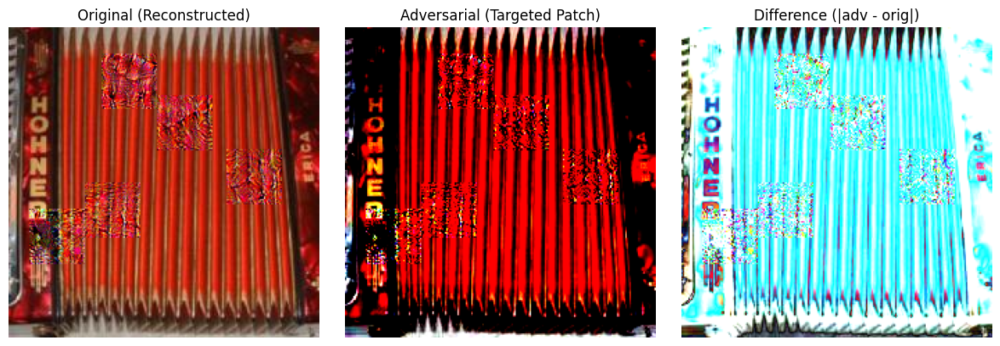

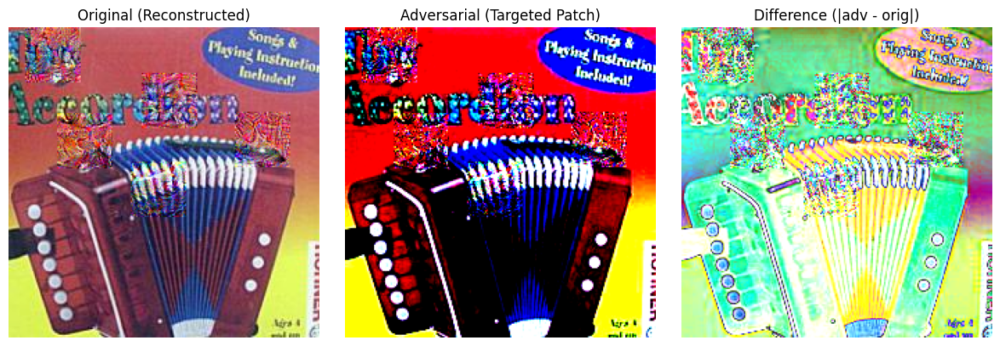

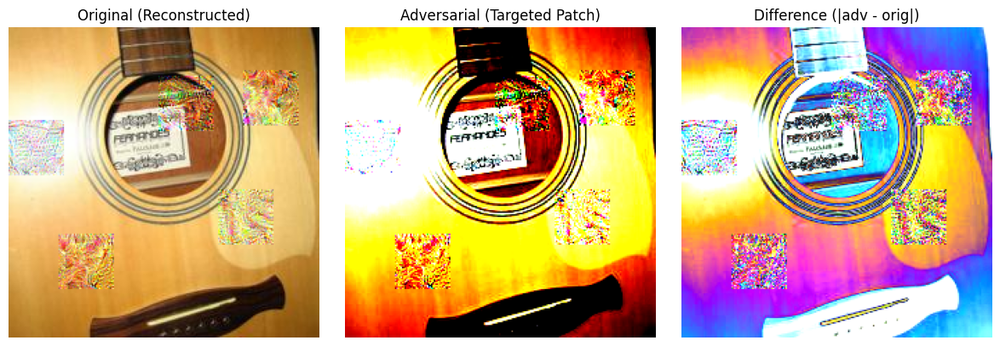

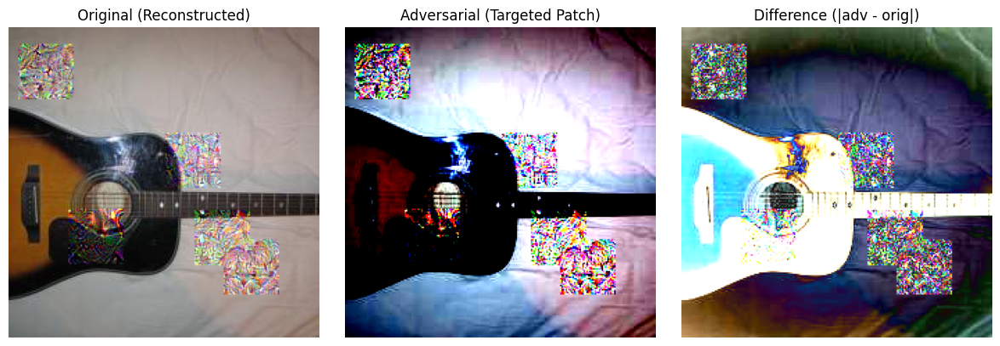

In [ ]:
# === Visualize 5 Examples of Targeted Patch Attack ===
import matplotlib.pyplot as plt

num_visualize = 5
for i in range(num_visualize):
    orig = norm(unnorm(targeted_patch_images[i])).squeeze(0).permute(1, 2, 0)  # reconvert to normalized image
    adv = norm(targeted_patch_images[i]).squeeze(0).permute(1, 2, 0)
    diff = (adv - orig).abs()

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    axes[0].imshow(orig.numpy())
    axes[0].set_title("Original (Reconstructed)")
    axes[1].imshow(adv.numpy())
    axes[1].set_title("Adversarial (Targeted Patch)")
    axes[2].imshow(diff.numpy())
    axes[2].set_title("Difference (|adv - orig|)")

    for ax in axes:
        ax.axis('off')
    plt.tight_layout()
    plt.show()

In [ ]:
# target 2

import os
import random
import torch
from torchvision.utils import save_image
from torch.utils.data import DataLoader, TensorDataset
from torchvision import transforms
import torchvision.models as models
from matplotlib import pyplot as plt

# === Parameters ===
patch_epsilon = 0.5
patch_alpha = 0.03
patch_iters = 100
patch_size = 32
num_patches = 8
num_classes = 1000
fixed_target_class = 207  # e.g., golden retriever

mean_norms = [0.485, 0.456, 0.406]
std_norms = [0.229, 0.224, 0.225]

unnorm = transforms.Normalize(
    mean=[-m / s for m, s in zip(mean_norms, std_norms)],
    std=[1 / s for s in std_norms]
)
norm = transforms.Normalize(mean=mean_norms, std=std_norms)

# === Targeted Patch PGD Attack with Random Start + Momentum ===
def multi_patch_pgd_attack_targeted(image, true_label, model, loss_fn,
                                    target_class=207, epsilon=0.5, alpha=0.03, iters=100,
                                    patch_size=40, num_patches=8):
    device = image.device
    perturbed = image.clone().detach()
    original = image.clone().detach()
    _, _, h, w = perturbed.shape

    # === Create patch mask ===
    patch_masks = []
    for _ in range(num_patches):
        top = random.randint(0, h - patch_size)
        left = random.randint(0, w - patch_size)
        mask = torch.zeros_like(image)
        mask[:, :, top:top+patch_size, left:left+patch_size] = 1.0
        patch_masks.append(mask)
    patch_mask = torch.clamp(sum(patch_masks), 0, 1)

    # === Random start ===
    perturbed = original + (torch.rand_like(original) - 0.5) * 2 * epsilon * patch_mask
    perturbed = torch.clamp(perturbed, 0, 1).detach()

    # === Fixed target label ===
    target_label = torch.tensor([target_class], device=device)

    # === Momentum PGD ===
    momentum = torch.zeros_like(image).to(device)
    decay = 1.0

    for _ in range(iters):
        perturbed.requires_grad = True
        output = model(norm(perturbed))
        loss = -loss_fn(output, target_label)
        model.zero_grad()
        loss.backward()

        grad = perturbed.grad.detach() * patch_mask
        grad = grad / torch.mean(torch.abs(grad), dim=(1, 2, 3), keepdim=True)
        momentum = decay * momentum + grad

        perturbed = perturbed + alpha * momentum.sign()
        perturb = torch.clamp(perturbed - original, min=-epsilon, max=epsilon) * patch_mask
        perturbed = torch.clamp(original + perturb, 0, 1).detach()

    return perturbed, target_class

# === Attack Loop ===
os.makedirs("/kaggle/working/Adversarial_Test_Set_TargetedPatch", exist_ok=True)

targeted_patch_images = []
targeted_patch_labels = []
targeted_patch_targets = []
success = 0
skip_pred_wrong = 0
skip_attack_failed = 0
total = 0

for input_batch, label_batch in dataloader:
    if len(targeted_patch_images) >= 500:
        break

    input_batch = input_batch.to(device)
    label_batch = label_batch.to(device)

    for j in range(len(input_batch)):
        if len(targeted_patch_images) >= 500:
            break

        input_img = input_batch[j:j+1].clone().detach()
        label = label_batch[j:j+1]
        label_scalar = label.item()
        true_label_index = true_label_map[label_scalar]
        true_label = torch.tensor([true_label_index], device=device)

        output = model(input_img)
        if output.argmax(dim=1)[0].item() != true_label.item():
            skip_pred_wrong += 1
            continue

        input_img_raw = unnorm(input_img.squeeze(0)).unsqueeze(0).to(device)

        adv_img, target_class = multi_patch_pgd_attack_targeted(
            input_img_raw, true_label, model, loss_fn,
            target_class=fixed_target_class,
            epsilon=patch_epsilon, alpha=patch_alpha, iters=patch_iters,
            patch_size=patch_size, num_patches=num_patches
        )

        output_adv = model(norm(adv_img))
        final_pred = output_adv.argmax(dim=1)[0].item()
        if final_pred == target_class:
            success += 1
        else:
            skip_attack_failed += 1

        total += 1
        targeted_patch_images.append(adv_img.detach().cpu())
        targeted_patch_labels.append(torch.tensor(true_label_index))
        targeted_patch_targets.append(torch.tensor(target_class))

        save_image(norm(adv_img).squeeze(0), f"/kaggle/working/Adversarial_Test_Set_TargetedPatch/adv_patch_{len(targeted_patch_images)}.png")

print("\nTargeted Multi-Patch PGD Attack Summary:")
print(f"Total evaluated samples: {total}")
print(f"Successful targeted attacks: {success}")
print(f"Samples skipped due to incorrect original prediction: {skip_pred_wrong}")
print(f"Samples where attack failed to reach target: {skip_attack_failed}")
print(f"Targeted adversarial images collected: {len(targeted_patch_images)}")

# === Evaluate Targeted Patch Attack on ResNet ===
patch_dataset = TensorDataset(torch.cat(targeted_patch_images, dim=0), torch.tensor(targeted_patch_labels))
patch_loader = DataLoader(patch_dataset, batch_size=32, shuffle=False)

top1_patch, top5_patch = evaluate_with_remap(model, patch_loader, true_label_map)
print(f"[Targeted Patch Eval] Top-1 Accuracy: {top1_patch:.4f}")
print(f"[Targeted Patch Eval] Top-5 Accuracy: {top5_patch:.4f}")


Targeted Multi-Patch PGD Attack Summary:
Total evaluated samples: 380
Successful targeted attacks: 380
Samples skipped due to incorrect original prediction: 120
Samples where attack failed to reach target: 0
Targeted adversarial images collected: 380
[Targeted Patch Eval] Top-1 Accuracy: 0.0526
[Targeted Patch Eval] Top-5 Accuracy: 0.1868


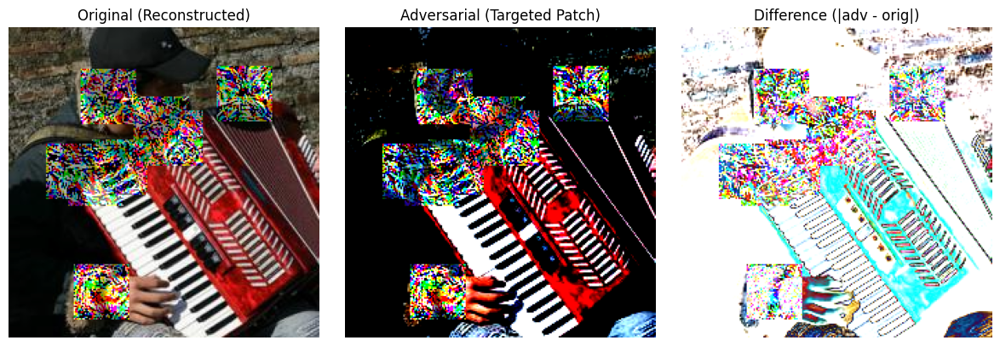

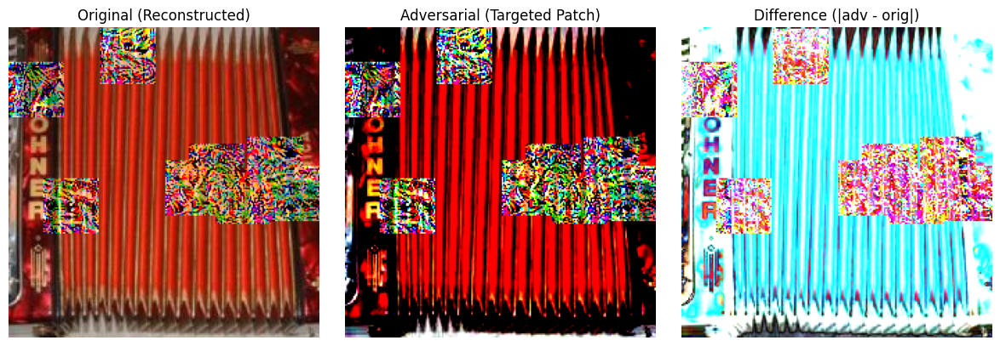

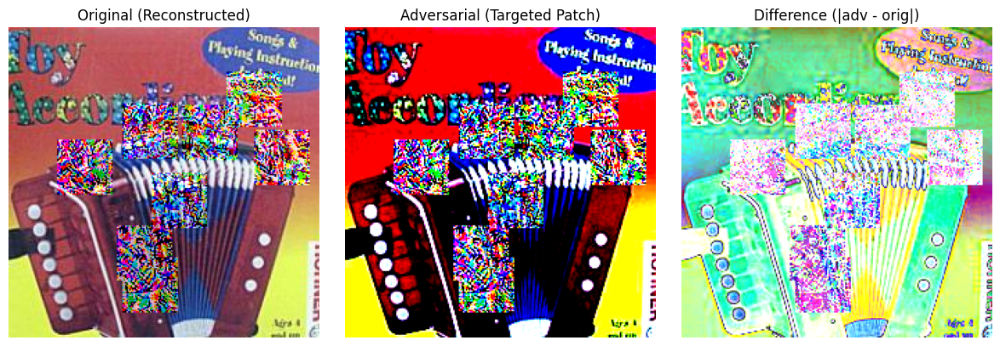

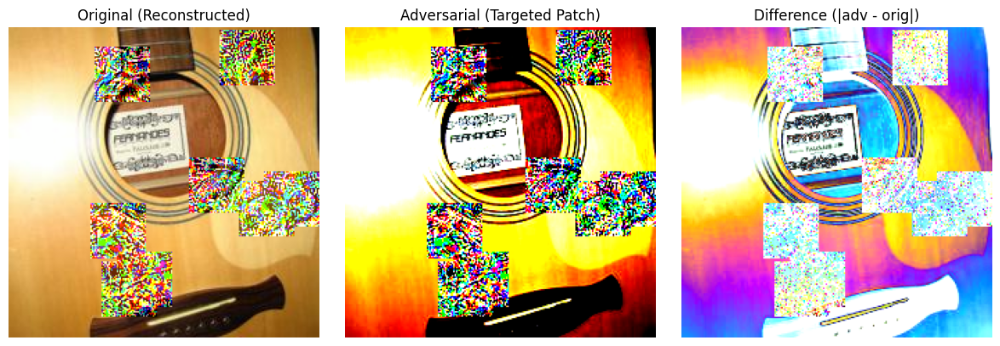

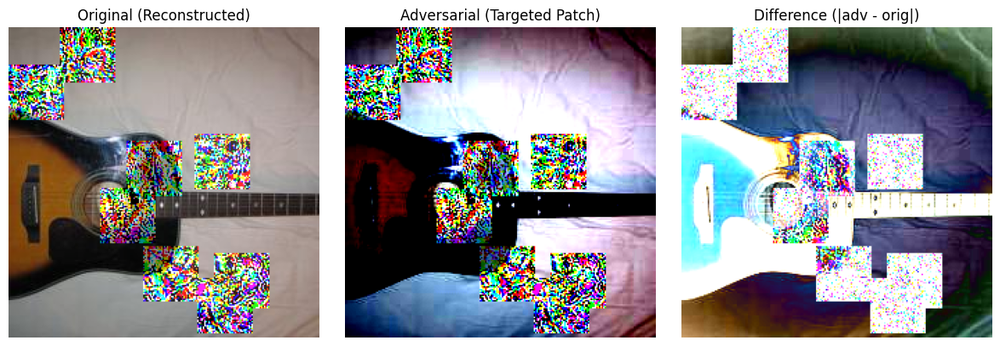

In [ ]:
# === Visualize 5 Examples of Targeted Patch Attack ===
import matplotlib.pyplot as plt

num_visualize = 5
for i in range(num_visualize):
    orig = norm(unnorm(targeted_patch_images[i])).squeeze(0).permute(1, 2, 0)  # reconvert to normalized image
    adv = norm(targeted_patch_images[i]).squeeze(0).permute(1, 2, 0)
    diff = (adv - orig).abs()

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    axes[0].imshow(orig.numpy())
    axes[0].set_title("Original (Reconstructed)")
    axes[1].imshow(adv.numpy())
    axes[1].set_title("Adversarial (Targeted Patch)")
    axes[2].imshow(diff.numpy())
    axes[2].set_title("Difference (|adv - orig|)")

    for ax in axes:
        ax.axis('off')
    plt.tight_layout()
    plt.show()

In [ ]:
## Task 5

In [ ]:
# === Task 5: Transferability Evaluation (ResNet-34 → DenseNet-121) ===

import torchvision.models as models
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, TensorDataset

# Normalization config
mean_norms = [0.485, 0.456, 0.406]
std_norms = [0.229, 0.224, 0.225]
normalize = transforms.Normalize(mean=mean_norms, std=std_norms)

# Load transfer model
transfer_model = models.densenet121(weights='IMAGENET1K_V1').to(device)
transfer_model.eval()

# Define evaluation function
def evaluate_transfer(model, images, labels):
    if len(images) == 0 or len(labels) == 0:
        print("[Warning] Empty image or label list passed to evaluation.")
        return 0.0, 0.0

    model.eval()
    images_tensor = torch.cat(images, dim=0).to(device)
    labels_tensor = torch.cat([l.unsqueeze(0) if l.dim() == 0 else l for l in labels], dim=0).to(device)

    dataloader = DataLoader(TensorDataset(images_tensor, labels_tensor), batch_size=32, shuffle=False)
    top1, top5, total = 0, 0, 0
    with torch.no_grad():
        for x, y in dataloader:
            x, y = x.to(device), y.to(device)
            x = torch.stack([normalize(img) for img in x])
            out = model(x)
            _, preds = out.topk(5, 1)
            top1 += (preds[:, 0] == y).sum().item()
            top5 += sum([y[i] in preds[i] for i in range(len(y))])
            total += y.size(0)

    return (top1 / total if total > 0 else 0.0), (top5 / total if total > 0 else 0.0)

# Load original image-label pairs (using original ImageFolder labels)
orig_images, orig_labels = [], []
for input_img, label in dataloader:
    input_img = input_img.to(device)
    label = label.to(device)
    for j in range(input_img.size(0)):
        img = input_img[j].unsqueeze(0).detach()
        orig_images.append(img)
        orig_labels.append(label[j].unsqueeze(0))
    if len(orig_images) >= 500:
        break

# Helper to filter and (optionally) map labels

def filter_and_map(images, labels, label_map=None):
    filtered_images = []
    mapped_labels = []
    for i, l in enumerate(labels):
        lid = int(l.item())
        if label_map is None or lid in label_map:
            filtered_images.append(images[i])
            mapped = label_map[lid] if label_map else lid
            mapped_labels.append(torch.tensor([mapped]))
    return filtered_images, mapped_labels

# Apply filtering and mapping appropriately
filtered_orig_images, mapped_orig_labels = filter_and_map(orig_images, orig_labels, true_label_map)
filtered_adv_images, mapped_fgsm_labels = filter_and_map(adv_images, adv_labels, None)
# filtered_pgd_images, mapped_pgd_labels = filter_and_map(pgd_images, pgd_labels, None)
filtered_pgd_images, mapped_pgd_labels = filter_and_map(pgd_adv_images, pgd_adv_labels, None)
filtered_patch_images, mapped_patch_labels = filter_and_map(multi_patch_images, multi_patch_labels, None)
filtered_targeted_patch_images, mapped_targeted_patch_labels = filter_and_map(targeted_patch_images, targeted_patch_labels, None)


# Evaluate all sets using mapped ImageNet labels
original_top1, original_top5 = evaluate_transfer(transfer_model, filtered_orig_images, mapped_orig_labels)
fgsm_top1, fgsm_top5 = evaluate_transfer(transfer_model, filtered_adv_images, mapped_fgsm_labels)
pgd_top1_transfer, pgd_top5_transfer = evaluate_transfer(transfer_model, filtered_pgd_images, mapped_pgd_labels)
patch_top1_transfer, patch_top5_transfer = evaluate_transfer(transfer_model, filtered_patch_images, mapped_patch_labels)
targeted_patch_top1, targeted_patch_top5 = evaluate_transfer(transfer_model, filtered_targeted_patch_images, mapped_targeted_patch_labels)


# Print results
print("\n=== Transfer Model Accuracy (DenseNet-121) ===")
print(f"Original Top-1: {original_top1:.4f}, Top-5: {original_top5:.4f}")
print(f"FGSM Top-1:    {fgsm_top1:.4f}, Top-5: {fgsm_top5:.4f}")
print(f"PGD Top-1:     {pgd_top1_transfer:.4f}, Top-5: {pgd_top5_transfer:.4f}")
print(f"Patch Top-1:   {patch_top1_transfer:.4f}, Top-5: {patch_top5_transfer:.4f}")
print(f"Targeted Patch Top-1: {targeted_patch_top1:.4f}, Top-5: {targeted_patch_top5:.4f}")


=== Transfer Model Accuracy (DenseNet-121) ===
Original Top-1: 0.6280, Top-5: 0.8740
FGSM Top-1:    0.5921, Top-5: 0.8211
PGD Top-1:     0.6184, Top-5: 0.8658
Patch Top-1:   0.7895, Top-5: 0.9579
Targeted Patch Top-1: 0.4395, Top-5: 0.7026
